# Assignment 2

Minh Ly Nguyen - 22201371

YUHAN JIAO  - 22200559

# Introduction

This notebook has 5 main parts:

Part 0: Import all supporting libraries that will be used in the notebook

Part 1: Implement 3 sorting algorithms
- 1.1 Set up implementations of 3 sorting algorithms & Apply unit test
- 1.2 Create list of elements for input and setup functions to calculate and plot running time
- 1.3 Calculate Running Time of *Bubble sort* on different reverse order lists, plot it as function of lists' size and discuss the obtained result
- 1.4 Calculate Running Time of *traditional Quick sort* on different reverse order lists, plot it as function of lists' size and discuss the obtained result 
- 1.5 Calculate Running Time of *simple Quick sort* on different reverse order lists, plot it as function of lists' size and discuss the obtained result 
- 1.6 Calculate Running Time of *Merge sort* on different reverse order lists, plot it as function of lists' size and discuss the obtained result
- 1.7 Compare Running Time of 3 sorting algorithms
- 1.8  Curve fitting of 4 sorting algorithms

Part 2: Implement Dijkstra's algorithm
- 2.1 Use pen and paper to run through the algorithm to find shortest path from A to G
- 2.2 Discuss the implementation and result in 2.1
- 2.3 Confirm the result in 2.1 using networkX and its Dijkstra related functions

Part 3: Implement Prim's algorithm
- 3.1 Use pen and paper to run through the algorithm to find MSP
- 3.2 Discuss the implementation and result in 3.1
- 3.3 Confirm the result in 3.1 using networkX and its MSP related functions

Part 4: Conclusion

# Part 0

Import all supporting libraries that will be used

In [61]:
import time
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.optimize import curve_fit
from scipy.stats import linregress
import collections
import math
import networkx as nx
from sklearn.manifold import MDS

# Part 1

## 1.1 Set up implementations of 3 sorting algorithms

In [62]:
# Python implementation of Bubble sort.
def bubble_sort(arr):
    """Return a sorted array from the input array"""
    arr_size = len(arr)
    for i in range(arr_size):
        for j in range(i, arr_size):
            if arr[i] > arr[j]:
                arr[i], arr[j] = arr[j], arr[i]
    return arr

In [93]:
def partition(arr, low, high):
    """Return a pivot element for Quicksort."""
    pivot = (low + high) // 2
    key = arr[pivot]
    arr[pivot], arr[high] = arr[high], arr[pivot]
    i = low
    for j in range(low, high):
        if arr[j] <= key:
            arr[i], arr[j] = arr[j], arr[i]
            i += 1

    arr[i], arr[high] = arr[high], arr[i]
    return i

def quick_sort(arr, low=0, high=None):
    """Sort the input array"""
    if high is None:
        high = len(arr) - 1

    if high <= low:
        return
    else:
        pivot = partition(arr, low, high)
        quick_sort(arr, low, pivot - 1)
        quick_sort(arr, pivot + 1, high)



# Python simple implementation of Quick sort
def quick_sort_simple(data):
    """Return a sorted array from input array"""
    if len(data) > 1:
        less = []
        equal = []
        greater = []
        pivot = data[0]

        for x in data:
            if x < pivot:
                less.append(x)
            elif x == pivot:
                equal.append(x)
            else:
                greater.append(x)

        return quick_sort_simple(less) + equal + quick_sort_simple(greater)

    else:
        return data

In this simplified version of the quicksort algorithm, three new lists - less, equal, and greater - are created with each recursive call. This can result in a significant amount of memory allocation when dealing with very large input lists. Additionally, the depth of the recursive call stack is also affected as the algorithm needs to create and merge these lists at each level of recursion.

While this simplified version of the quicksort algorithm is easy to understand, it may encounter performance issues when dealing with large datasets. To reduce memory usage and call stack depth, we can use an "in-place" version of the quicksort algorithm which does not require the creation of extra lists but rather performs all sorting operations within the original input list. This greatly reduces memory usage and call stack depth, resulting in better performance when dealing with large datasets.

In [94]:
# Python implementation of Merge sort.
def merge(left, right):
    """Return a merged sorted list from two input sorted lists"""
    result = []
    left_idx, right_idx = 0, 0
    while left_idx < len(left) and right_idx < len(right):
        if left[left_idx] <= right[right_idx]:
            result.append(left[left_idx])
            left_idx += 1
        else:
            result.append(right[right_idx])
            right_idx += 1
 
    if left:
        result.extend(left[left_idx:])
    if right:
        result.extend(right[right_idx:])
    return result


def merge_sort(arr):
    """Return a sorted array from the input array"""
    if len(arr) <= 1:
        return arr
 
    mid = len(arr) // 2
    left = arr[:mid]
    right = arr[mid:]
 
    left = merge_sort(left)
    right = merge_sort(right)
    return list(merge(left, right))

### Apply Unittest 

In [95]:
import unittest

class SortingTest(unittest.TestCase):
    def __init__(self, *args, **kwargs):
        super(SortingTest, self).__init__(*args, **kwargs)
        self.test_arr = [[1], [1, 2], [2, 1], [5, 2, 7, 1, 8], [1, 2, 5, 7, 8],
                [10, 272, 100, -98, 876, 877754, 98124, 0, 1000000, -100]]
        self.test_text_arr = [['cat','dog','bird','aardvark'],['dublin','berlin','Cork']]

    def test_bubble_sort(self):
        """Test bubble sort."""
        for arr in self.test_arr:
            self.assertEqual(bubble_sort(arr), sorted(arr))

    def test_quick_sort_inplace(self):
        """Test quick sort."""
        for arr in self.test_arr:
            quick_sort(arr)
            self.assertEqual(arr, sorted(arr))
            
    def test_quick_sort_simple(self):
        """Test quick sort."""
        for arr in self.test_arr:
            quick_sort_simple(arr)
            self.assertEqual(quick_sort_simple(arr), sorted(arr))
            
    def test_merge_sort(self):
        """Test merge sort."""
        for arr in self.test_arr:
            self.assertEqual(merge_sort(arr), sorted(arr))
            
if __name__ == '__main__':
    unittest.main(argv=['ignored', '-v'], exit=False)

test_bubble_sort (__main__.SortingTest)
Test bubble sort. ... ok
test_merge_sort (__main__.SortingTest)
Test merge sort. ... ok
test_quick_sort_inplace (__main__.SortingTest)
Test quick sort. ... ok
test_quick_sort_simple (__main__.SortingTest)
Test quick sort. ... ok

----------------------------------------------------------------------
Ran 4 tests in 0.010s

OK


## 1.2 Create list of elements for input and setup functions to calculate and plot running time

In [96]:
# Create an descending order list which contains 500 elements
reversed_list = list(reversed(range(10, 5001,10)))
print(reversed_list)

[5000, 4990, 4980, 4970, 4960, 4950, 4940, 4930, 4920, 4910, 4900, 4890, 4880, 4870, 4860, 4850, 4840, 4830, 4820, 4810, 4800, 4790, 4780, 4770, 4760, 4750, 4740, 4730, 4720, 4710, 4700, 4690, 4680, 4670, 4660, 4650, 4640, 4630, 4620, 4610, 4600, 4590, 4580, 4570, 4560, 4550, 4540, 4530, 4520, 4510, 4500, 4490, 4480, 4470, 4460, 4450, 4440, 4430, 4420, 4410, 4400, 4390, 4380, 4370, 4360, 4350, 4340, 4330, 4320, 4310, 4300, 4290, 4280, 4270, 4260, 4250, 4240, 4230, 4220, 4210, 4200, 4190, 4180, 4170, 4160, 4150, 4140, 4130, 4120, 4110, 4100, 4090, 4080, 4070, 4060, 4050, 4040, 4030, 4020, 4010, 4000, 3990, 3980, 3970, 3960, 3950, 3940, 3930, 3920, 3910, 3900, 3890, 3880, 3870, 3860, 3850, 3840, 3830, 3820, 3810, 3800, 3790, 3780, 3770, 3760, 3750, 3740, 3730, 3720, 3710, 3700, 3690, 3680, 3670, 3660, 3650, 3640, 3630, 3620, 3610, 3600, 3590, 3580, 3570, 3560, 3550, 3540, 3530, 3520, 3510, 3500, 3490, 3480, 3470, 3460, 3450, 3440, 3430, 3420, 3410, 3400, 3390, 3380, 3370, 3360, 3350, 334

### Define functions to calculate running times and plot the running time as a function of input size

In [97]:
def sort_time(input_list,function):
    """Take a list and a function
    Return the running time when running the function with the list as input"""
    start_time = time.perf_counter()
    function(input_list)
    end_time = time.perf_counter()
    return end_time-start_time

In [98]:
def running_time_test(input_list,sort_function):
    """Divide the input_list into smaller lists and run the input sort_function with smaller lists
    Return lists of sizes of the small lists 
    and lists of corresponding running time of sort_function on those small lists"""
    running_time=[]
    input_num=[]
    for i in range (10,len(input_list),10):
        running_time_temp=0
        list_slice=input_list[:i]
        input_num.append(i)
        #run 100 times every input list slice and get the average running time
        for j in range (100): 
             running_time_temp += sort_time(list_slice,sort_function)
        running_time.append(running_time_temp/100)
    print(input_num)    
    print(running_time)
    return input_num,running_time

In [99]:
def show_plot_single_line(input_num,time_list):
    """Plot the running time as a function of array size"""
    fig, ax = plt.subplots()
    ax.plot(input_num,time_list)
    ax.set_xlabel('Number of Input Elememts')
    ax.set_ylabel('Running Time') 
    plt.show()

## 1.3 Calculate Running Time of Bubble sort on different reverse order lists, plot it as function of lists' size and discuss the obtained result

[10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360, 370, 380, 390, 400, 410, 420, 430, 440, 450, 460, 470, 480, 490]
[6.182209981488995e-06, 3.290086004199111e-05, 6.347025990180555e-05, 0.0006617582100625441, 0.0003081975100940326, 0.00037153014985960906, 0.00029144369002096935, 0.00031724235997899087, 0.00048313643012079413, 0.000456679300077667, 0.0006807801398826996, 0.0007983583900386293, 0.0010892722299831804, 0.0009913192400563275, 0.0014500085899999248, 0.0014715792699644225, 0.0014340042000549147, 0.001962408419967687, 0.0024573228499320974, 0.0026188090100549744, 0.0032573413498357697, 0.0023214765201373666, 0.002612983789949794, 0.0035640107700783117, 0.002527457549949759, 0.0034992943400175137, 0.0031683883500227238, 0.0035457797800518163, 0.0034188106599503955, 0.0037411762999909116, 0.004214451110019581, 0.0052192409701638095, 0.004837708230243151, 0.005

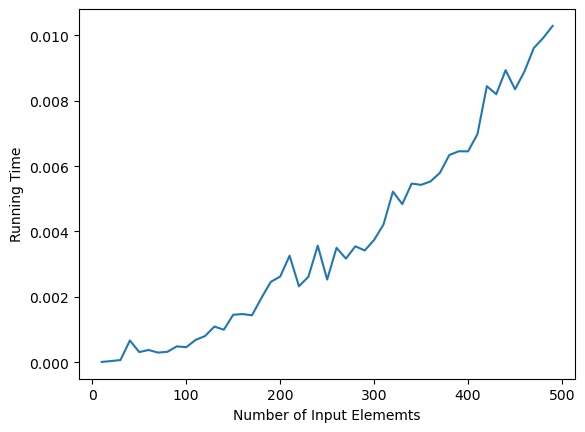

In [100]:
input_nums, bubblesort_running_times = running_time_test(reversed_list, bubble_sort)
show_plot_single_line(input_nums, bubblesort_running_times)

## Discussion on result:
- Theoretically, Bubble sort has time complexity of $\mathcal{O}(n^{2})$ with n is the size of input arrays.
- In this specific implementation, the plot proves the theoretical time complexity by showing that running time is a nearly quadratic function of the array size.


## 1.4 Calculate Running Time of Traditional Quick sort on different reverse order lists, plot it as function of lists' size and discuss the obtained result

[10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360, 370, 380, 390, 400, 410, 420, 430, 440, 450, 460, 470, 480, 490]
[9.172010086331284e-06, 2.31306800742459e-05, 4.4512959975691045e-05, 5.078314005004358e-05, 0.00010363455996412085, 0.00010949510004138575, 9.226836995367194e-05, 0.0001193418900402321, 0.00016976651990262325, 0.0001851978199920268, 0.00024108518009597902, 0.00017443826003727737, 0.0002583553700969787, 0.0002622960599910584, 0.0004727201799505565, 0.00025501652011371333, 0.0003324672999769973, 0.00043137657989063884, 0.00040029706007771893, 0.0004615433199796826, 0.0003830071199990925, 0.00035551263003071656, 0.0004365249099100765, 0.000442298399975698, 0.0005211723199681728, 0.000555573299916432, 0.0005350496299979568, 0.00048274333008521355, 0.0005918934600413195, 0.000652165209849045, 0.0007608214298306848, 0.0007409049099442199, 0.00063807299007748

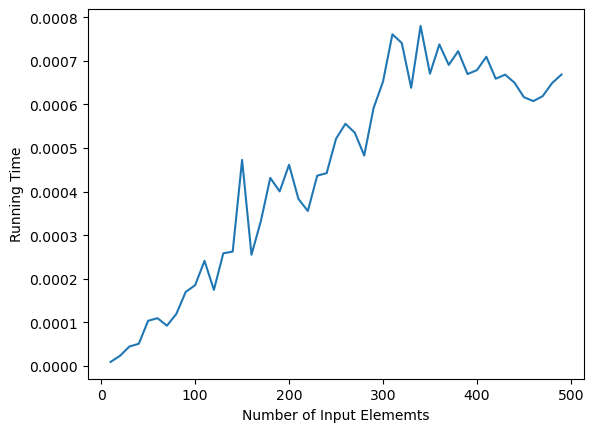

In [101]:
input_nums, quicksort_running_times = running_time_test(reversed_list, quick_sort)
show_plot_single_line(input_nums, quicksort_running_times)

## Discussion on result:
- Theoretically, with setups which let the pivot is the first or last element of the list, and the inputs which are (descending) order lists in this implementation, traditional Quick sort has worst-case time complexity of $\mathcal{O}(n^{2})$ with n is the size of input arrays
- The plot proves this time complexity by showing that running time is a nearly quadratic function of the array size


## 1.5 Calculate Running Time of Simple Quick sort on different reverse order lists, plot it as function of lists' size and discuss the obtained result

[10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360, 370, 380, 390, 400, 410, 420, 430, 440, 450, 460, 470, 480, 490]
[1.732452996293432e-05, 3.5945219970017206e-05, 8.64842398368637e-05, 0.00018099901999448775, 0.000136177399999724, 0.0002360630501425476, 0.0002630641400719469, 0.0003425970299394976, 0.0004011740699934308, 0.0005448077299297438, 0.0006540137400952517, 0.0007898158499119745, 0.000832141219998448, 0.000978442260020529, 0.0011192468900298991, 0.0013263128300786775, 0.0019840045699129403, 0.002221287750053307, 0.0040778605899686226, 0.0033833975601010023, 0.0029728321600487107, 0.003331896220042836, 0.002914272109956073, 0.002824726270027895, 0.003842235760148469, 0.004757615250000526, 0.005219957339977555, 0.005756811399933213, 0.008117578020101063, 0.0055492286099797635, 0.005992062439927395, 0.005750741879855923, 0.0066686861099333325, 0.00694354148012

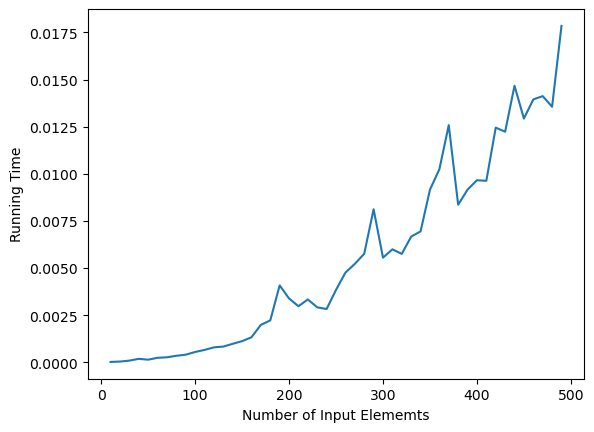

In [102]:
input_nums, quicksort_simple_running_times = running_time_test(reversed_list, quick_sort_simple)
show_plot_single_line(input_nums, quicksort_simple_running_times)

## Discussion on result:
- Theoretically, with setups which let the pivot is the first element of the list, and the inputs which are reverse list in this implementation, simple Quick sort has worst-case time complexity of $\mathcal{O}(n^{2})$ with n is the size of input arrays
- The plot proves this time complexity by showing that running time is a nearly quadratic function of the array size


## 1.6 Calculate Running Time of Merge sort on different reverse order lists, plot it as function of lists' size and discuss the obtained result

[10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360, 370, 380, 390, 400, 410, 420, 430, 440, 450, 460, 470, 480, 490]
[2.2205240020412022e-05, 3.866627997922478e-05, 0.00010940403020867962, 0.00013505872007954167, 0.00013722216992391621, 0.00015457709998372592, 0.00016768295990914338, 0.0002234884000608872, 0.00018219476005469913, 0.0001960049200170033, 0.00021847284004252287, 0.0002794826799254224, 0.0003225327798827493, 0.00036168741011351815, 0.0003390903899708064, 0.00037505668011363015, 0.0004571609499726037, 0.0005662265400860633, 0.0005500613600452198, 0.0004730839201511117, 0.0004927970301105233, 0.0005413046799912991, 0.00055057025008864, 0.0005095298000378535, 0.0005353431699768407, 0.0006493708799462183, 0.0007551114900343236, 0.0008682420100922173, 0.000836717819875048, 0.0007305746500060195, 0.0007373594198907085, 0.0008361381600479944, 0.00086401679991467

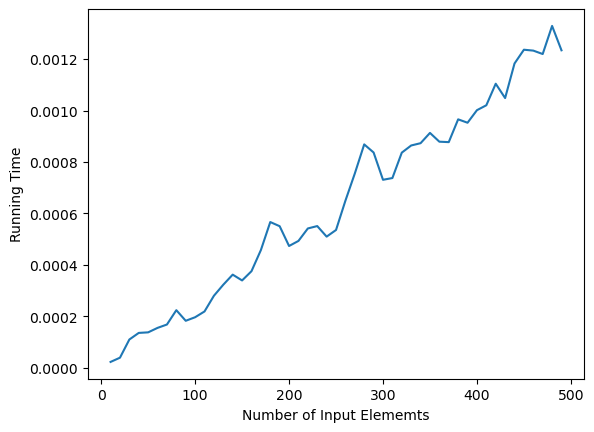

In [103]:
input_nums, mergesort_running_times = running_time_test(reversed_list, merge_sort)
show_plot_single_line(input_nums, mergesort_running_times)

## Discussion on result:
- With the input is a reversed order list
Merge sort has time complexity of $\mathcal{O}(nlogn)$ with n is the size of input arrays
- The plot proves the theoretical time complexity by showind that running time is a nearly nlogn function of the array size


## 1.7 Compare running time as a function of array size among 4 sorting algorithms

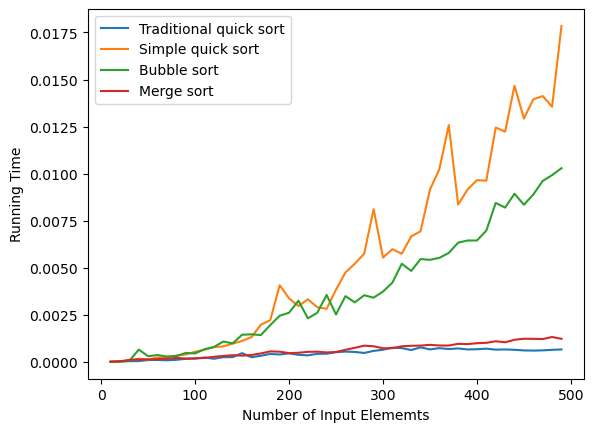

In [104]:
fig, ax = plt.subplots()
ax.plot(input_nums,quicksort_running_times, label="Traditional quick sort")
ax.plot(input_nums,quicksort_simple_running_times, label="Simple quick sort")
ax.plot(input_nums,bubblesort_running_times,label="Bubble sort")
ax.plot(input_nums,mergesort_running_times,label="Merge sort")
ax.legend()
ax.set_xlabel('Number of Input Elememts')
ax.set_ylabel('Running Time') 
plt.show()

### 1.8 Curve fitting of 4 sorting algorithms

In [117]:
def func_nlogn(x, a):
    return a * np.array(x) * np.log(np.array(x))

def func_n2(x, a):
    return a * np.array(x)**2

In [118]:
def plot_nlog_fitted_curve(x_data, y_data):
    # Fit the data using the defined function
    popt, _ = curve_fit(func_nlogn, x_data, y_data)

    # Plot the original data
    plt.scatter(x_data, y_data, label='Original Data')

    # Plot the fitted curve
    x_fit = np.linspace(min(x_data), max(x_data), 1000)
    y_fit = func_nlogn(x_fit, *popt)
    plt.plot(x_fit, y_fit, '--', label='Fitted Curve: a=%5.8f' % popt[0])


    # Add labels and legend
    plt.xlabel('n')
    plt.ylabel('Value')
    plt.legend()

    # Show the plot
    plt.show()

In [119]:
def plot_n2_fitted_curve(x_data, y_data):
    # Fit the data using the defined function
    popt, _ = curve_fit(func_n2, x_data, y_data)

    # Plot the original data
    plt.scatter(x_data, y_data, label='Original Data')

    # Plot the fitted curve
    x_fit = np.linspace(min(x_data), max(x_data), 1000)
    y_fit = func_n2(x_fit, *popt)
    plt.plot(x_fit, y_fit, '--', label='Fitted Curve: a=%5.8f' % popt[0])


    # Add labels and legend
    plt.xlabel('n')
    plt.ylabel('Value')
    plt.legend()

    # Show the plot
    plt.show()

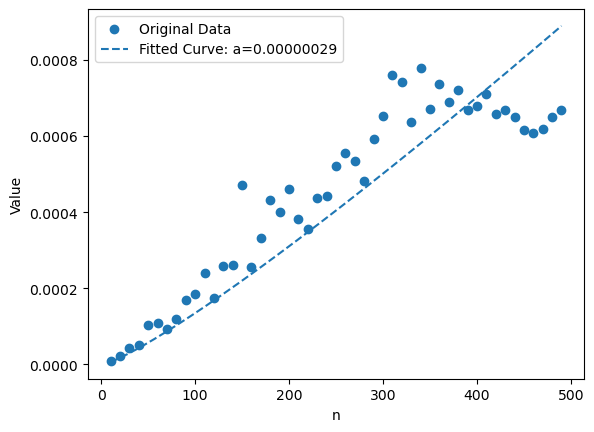

In [120]:
plot_nlog_fitted_curve(input_nums, quicksort_running_times)

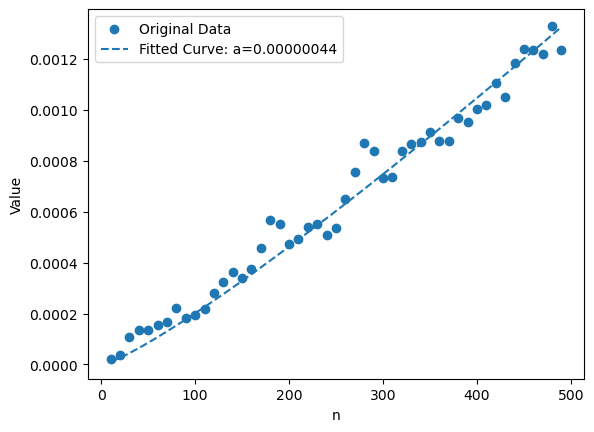

In [121]:
plot_nlog_fitted_curve(input_nums, mergesort_running_times)

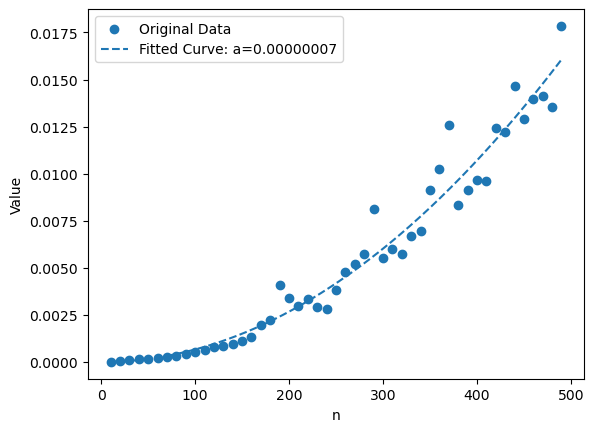

In [122]:
plot_n2_fitted_curve(input_nums, quicksort_simple_running_times)

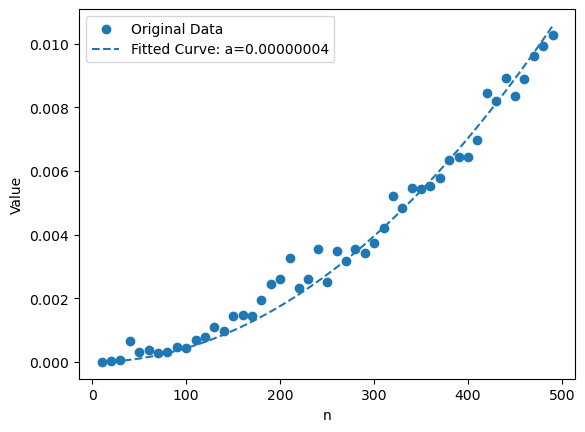

In [123]:
plot_n2_fitted_curve(input_nums, bubblesort_running_times)

## Discussion:
- With $\mathcal{O}(nlogn)$ time complexity, Merge Sort has significantly better running times compared the other 3 sorting algorithm of which time complexity is $\mathcal{O}(n^{2})$
- Among the $\mathcal{O}(n^{2})$ algorithms, Bubble Sort has better running time than two Quick sort implementations as the size of the input array increases. This can be explained by the fact that **Quick sort is recursive, while Bubble sort is not**. In Python, each function call creates a new stack frame, which takes up memory and requires some time to set up and tear down. When a recursive function is called multiple times in Python, this can create a significant amount of overhead.
- Between 2 implementations of Quick sort, traditional Quick sort which implements inplace sorting has worse running time than simple Quick sort which returns a sorted array from the input one. This might be explained by the fact that in the implementation of **traditional Quick sort** using Python, the codes **involve the calling of another function** (partition() function), which can cause a significant amount of overhead in Python. Also, there might be various other factors, including the Python interpreter used, the size of the input, and the specific implementation of the functions that affect the actual running times.

# Part 2

## 2.1 Use pen and paper to run through the algorithm to find shortest path from A to G

- Visited nodes are in the rows

- Distance from node A in columns for visited nodes

- Best distance from A to a column’s node is highlighted in blue

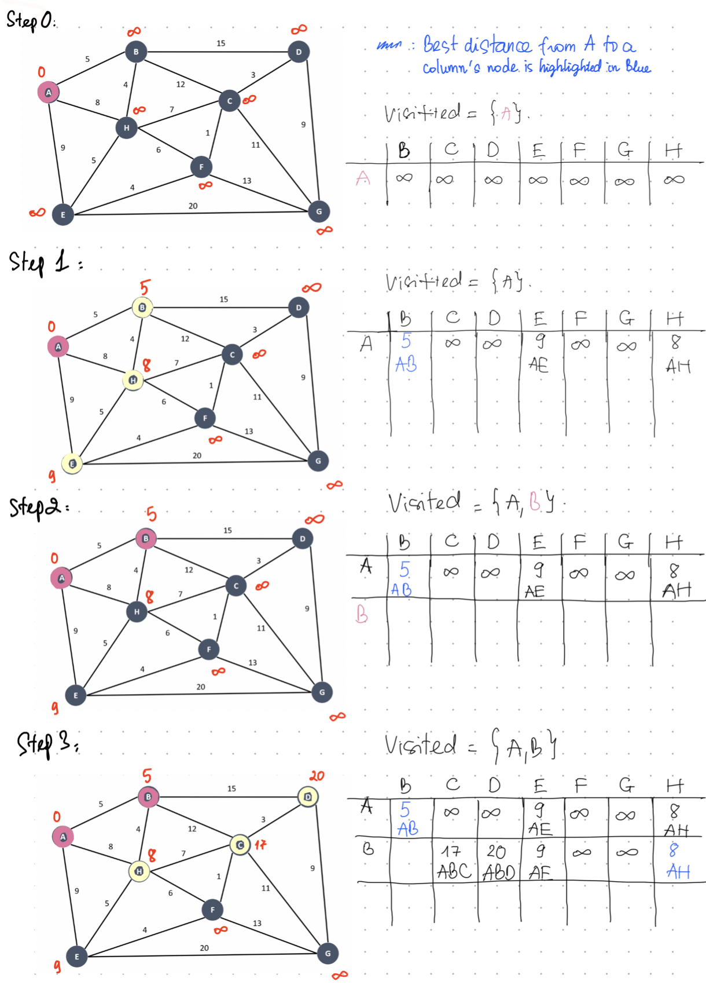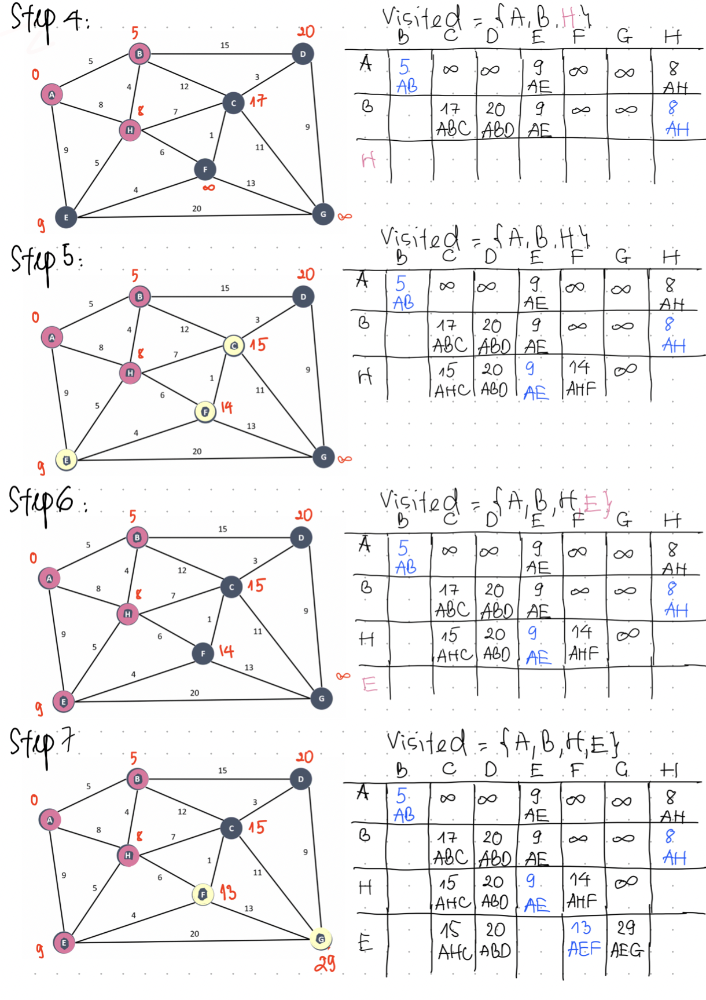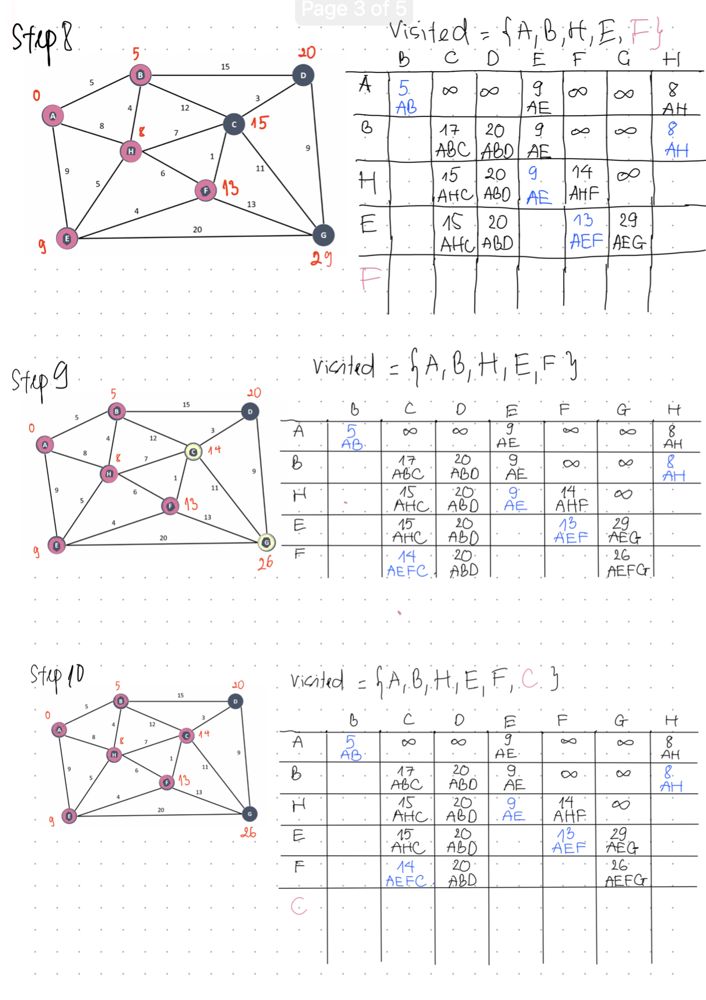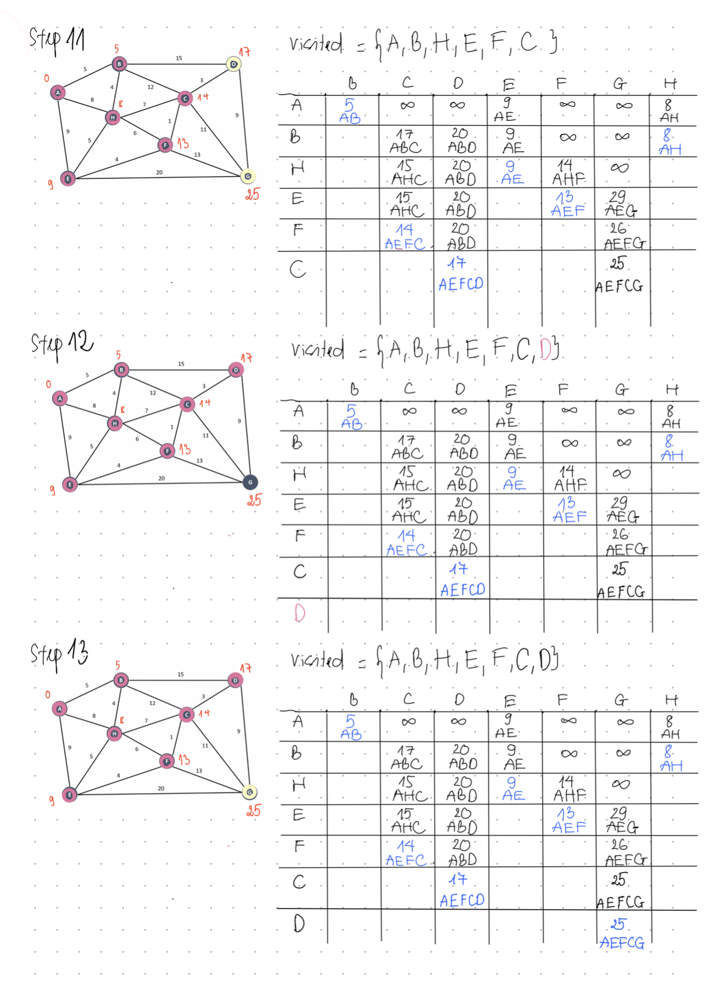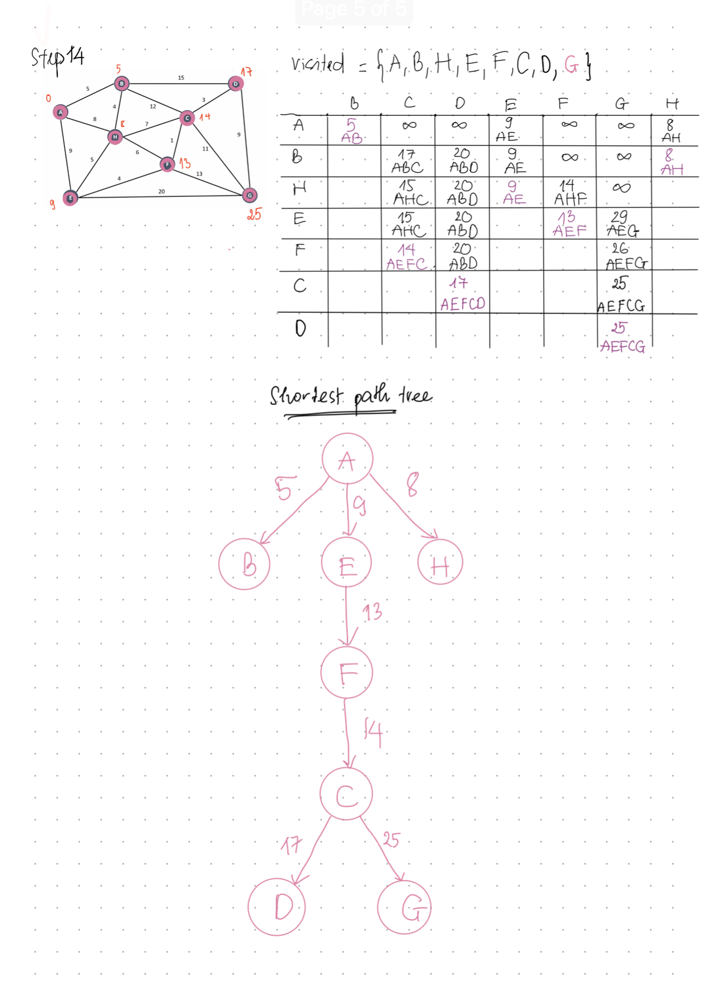

## 2.2 Discuss the implementation and result in 2.1

In the above implementation, the output is the shortest path from "A" to "G" in graph G, instead of shortest path from A to every node in G. Therefore, the algorithm can stop once the shortest distance is achieved for the destination node.

- With G as the target node, all nodes in the graph were visited, because the shortest path to G has the longest distance among all the other shortest path from A to all other nodes. 
- If the target node is another node (for example: D), G do not need to be visited. Similarly, if the target node is C, D and G do not need not be visited.

This implementation is a little different from the full Dijkstra's algorithm in which the output is the length of shortest path from a source node to all other nodes in the graph.

## 2.3 Confirm the result in 2.1 using networkX and its Dijkstra related functions


In [15]:
# Using networkX Python package to create an empty graph G
G = nx.Graph()

In [16]:
# Add nodes with their weights given in figure 1 to G
G.add_node('A')
G.add_node('B')
G.add_node('C')
G.add_node('D')
G.add_node('E')
G.add_node('F')
G.add_node('G')
G.add_node('H')

G.add_edge('A', 'B', weight=5)
G.add_edge('A', 'E', weight=9)
G.add_edge('A', 'H', weight=8)
G.add_edge('B', 'C', weight=12)
G.add_edge('B', 'D', weight=15)
G.add_edge('B', 'H', weight=4)
G.add_edge('C', 'D', weight=3)
G.add_edge('C', 'F', weight=1)
G.add_edge('C', 'G', weight=11)
G.add_edge('C', 'H', weight=7)
G.add_edge('D', 'G', weight=9)
G.add_edge('E', 'F', weight=4)
G.add_edge('E', 'G', weight=20)
G.add_edge('E', 'H', weight=5)
G.add_edge('F', 'G', weight=13)
G.add_edge('F', 'H', weight=6)

print(G)

Graph with 8 nodes and 16 edges


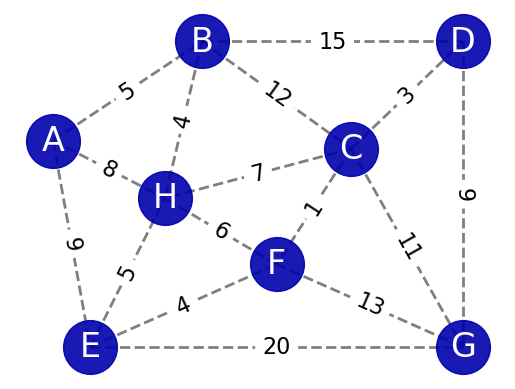

In [17]:
# Draw G, using a dictionary with node as keys and values as a co-ordinate list of tuple
pos= {'A': [-.7, -2], 
      'B': [-.3,  -.8], 
      'C': [0.1,-2.1], 
      'D': [0.4, -0.8], 
      'E': [ -.6, -4.5], 
      'F': [-0.1, -3.5],       
      'G': [0.4,-4.5], 
      'H': [-.4, -2.7]
     }
nx.draw_networkx_nodes(G, pos, node_size=1500, alpha=.9, node_color='#0000ac')
nx.draw_networkx_edges(G, pos, width=2, alpha=0.5, edge_color='k', style='dashed')
edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=16, font_family='sans-serif')
nx.draw_networkx_labels(G, pos, font_size=24, font_family='sans-serif', font_color='white')

limits=plt.axis('off') # turn of axis

In [18]:
# Using NetworkX single_source_dijkstra_path() and single_source_dijkstra_path_length() function
# to compute all shortest path and distance between vertex A and all other reachable vertices in the graph
# using Dijkstra algorithm

shortest_paths = nx.single_source_dijkstra_path(G,"A",weight='weight')
print(shortest_paths)
shortest_distances = nx.single_source_dijkstra_path_length(G, "A", weight='weight')
print(shortest_distances)

{'A': ['A'], 'B': ['A', 'B'], 'E': ['A', 'E'], 'H': ['A', 'H'], 'C': ['A', 'E', 'F', 'C'], 'D': ['A', 'E', 'F', 'C', 'D'], 'F': ['A', 'E', 'F'], 'G': ['A', 'E', 'F', 'C', 'G']}
{'A': 0, 'B': 5, 'H': 8, 'E': 9, 'F': 13, 'C': 14, 'D': 17, 'G': 25}


In [19]:
for key, values in shortest_paths.items():
    print("The shortest path from A to", key, "is", values, "with the distance of", shortest_distances.get(key))

The shortest path from A to A is ['A'] with the distance of 0
The shortest path from A to B is ['A', 'B'] with the distance of 5
The shortest path from A to E is ['A', 'E'] with the distance of 9
The shortest path from A to H is ['A', 'H'] with the distance of 8
The shortest path from A to C is ['A', 'E', 'F', 'C'] with the distance of 14
The shortest path from A to D is ['A', 'E', 'F', 'C', 'D'] with the distance of 17
The shortest path from A to F is ['A', 'E', 'F'] with the distance of 13
The shortest path from A to G is ['A', 'E', 'F', 'C', 'G'] with the distance of 25


In [20]:
edges = nx.dijkstra_predecessor_and_distance(G, "A", weight='weight')
print("Edges in the shortest path tree from vertex A:", edges[0])

Edges in the shortest path tree from vertex A: {'A': [], 'B': ['A'], 'E': ['A'], 'H': ['A'], 'C': ['F'], 'D': ['C'], 'F': ['E'], 'G': ['C']}


In [21]:
print(edges[1])

{'A': 0, 'B': 5, 'H': 8, 'E': 9, 'F': 13, 'C': 14, 'D': 17, 'G': 25}


In [22]:
edge_list=[]

for from_vertex, to_vertex in edges[0].items():
    if len(to_vertex) > 0:
#         spt.add_edge(from_vertex, to_vertex[0])
        edge = (from_vertex,to_vertex[0])
        edge_list.append(edge)

In [23]:
print(edge_list)

[('B', 'A'), ('E', 'A'), ('H', 'A'), ('C', 'F'), ('D', 'C'), ('F', 'E'), ('G', 'C')]


In [24]:
# Create a graph from graph G, only retain the edges in the shortest path tree
spt = nx.edge_subgraph(G, edge_list)

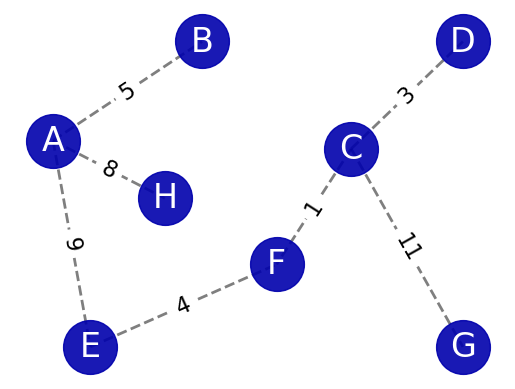

In [25]:
# Drawing the graph of shortest path tree, using the same position and format of G
nx.draw_networkx_nodes(spt, pos, node_size=1500, alpha=.9, node_color='#0000ac')
nx.draw_networkx_edges(spt, pos, width=2, alpha=0.5, edge_color='k', style='dashed')
edge_labels = nx.get_edge_attributes(spt, 'weight')
nx.draw_networkx_edge_labels(spt, pos, edge_labels=edge_labels, font_size=16, font_family='sans-serif')
nx.draw_networkx_labels(spt, pos, font_size=24, font_family='sans-serif', font_color='white')
limits=plt.axis('off') # turn of axis

## Discussion on result:
- networkx calculation confirms the result in 2.1


# Part 3

### 3.1 convet the problem to a MST question , show the step 

### 3.1.1 Find the MST step by step

Adjacency List of the weighted graph in bottom right. 
from root node 1, every step : use Adjacency List find edges connecting any tree vertex with the fringe vertices.Find the minimum among these edges(which marked in red circle).Add the chosen edge to the MST if it does not form any cycle.

### step1 visited node:1,8

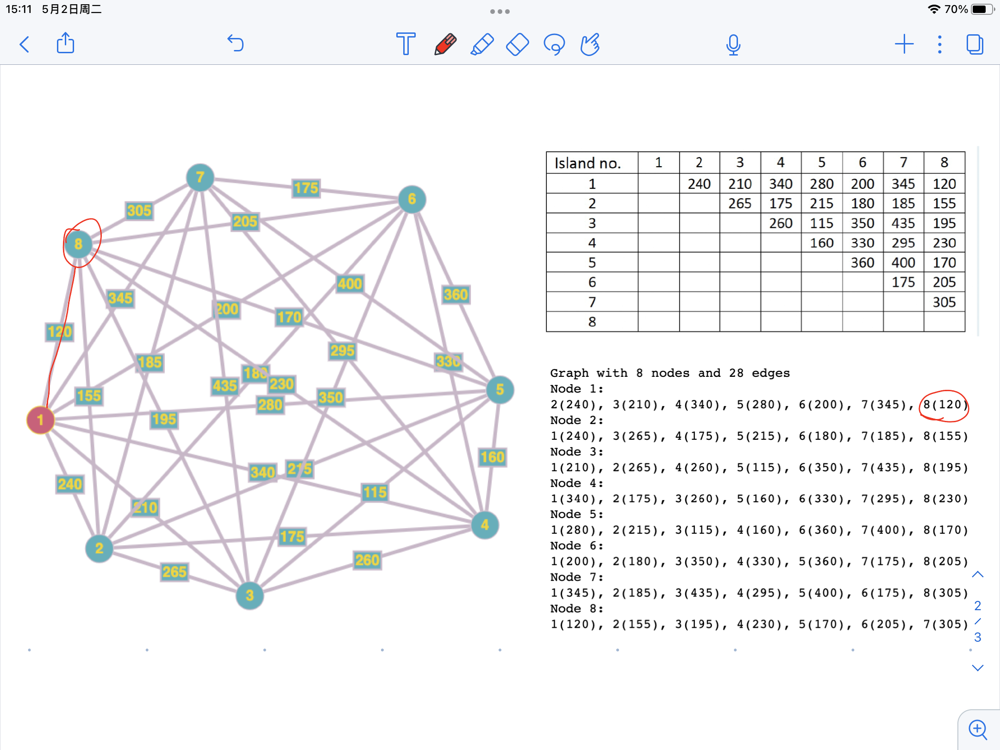

### step2 visited node:1,8,2

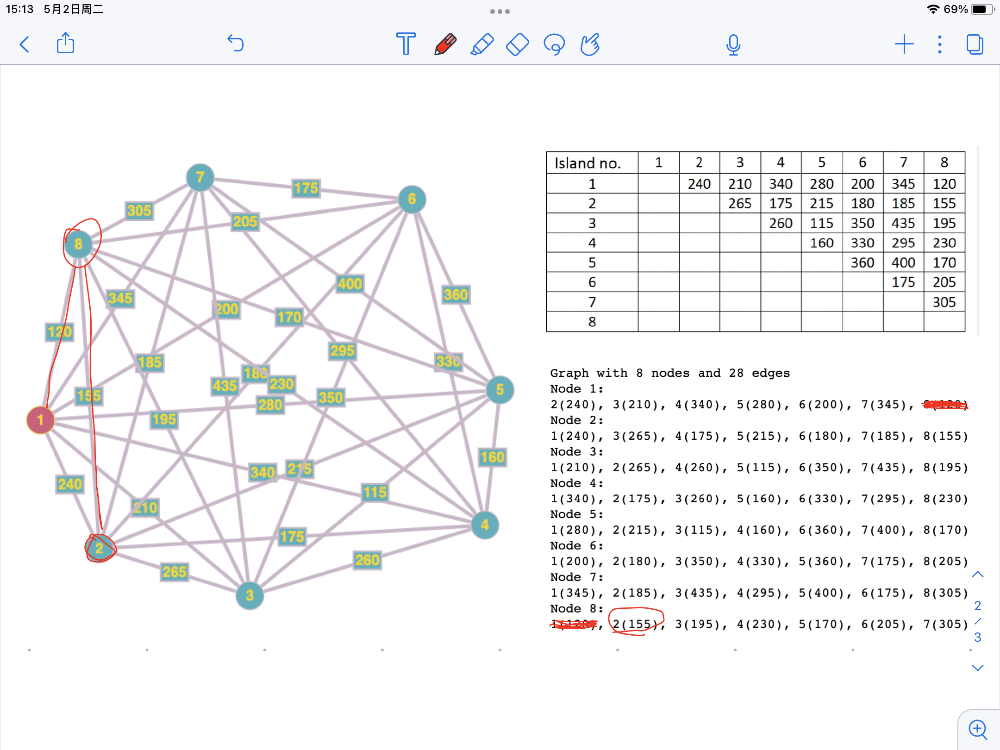

### step3 visited node:1,8,2,5

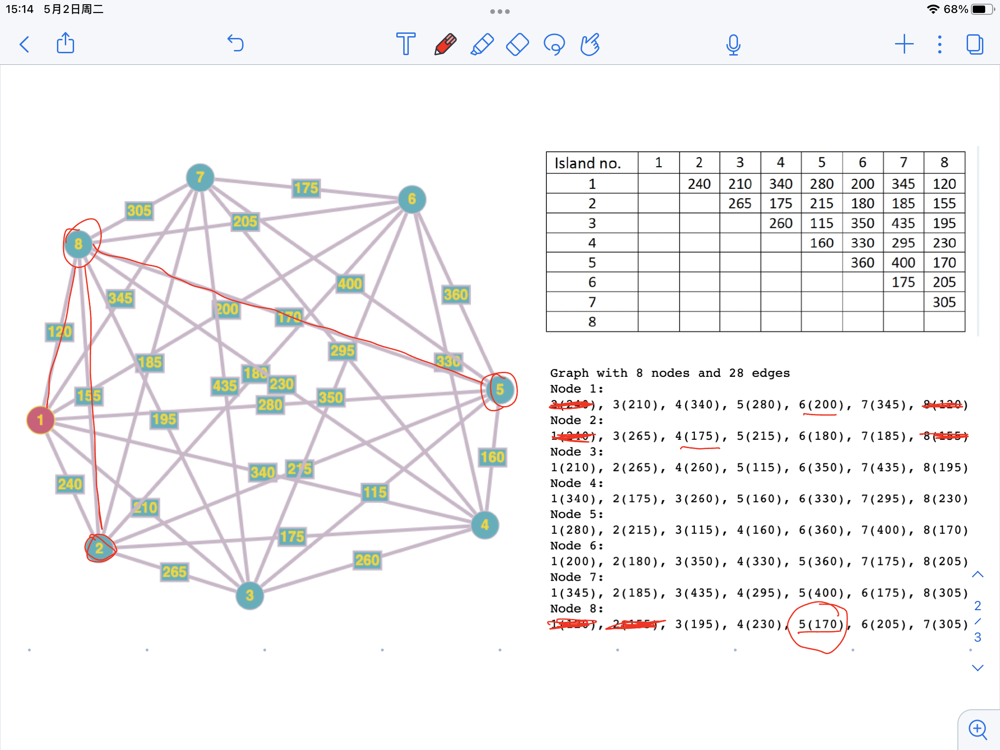

### step4 visited node:1,8,2,5,3

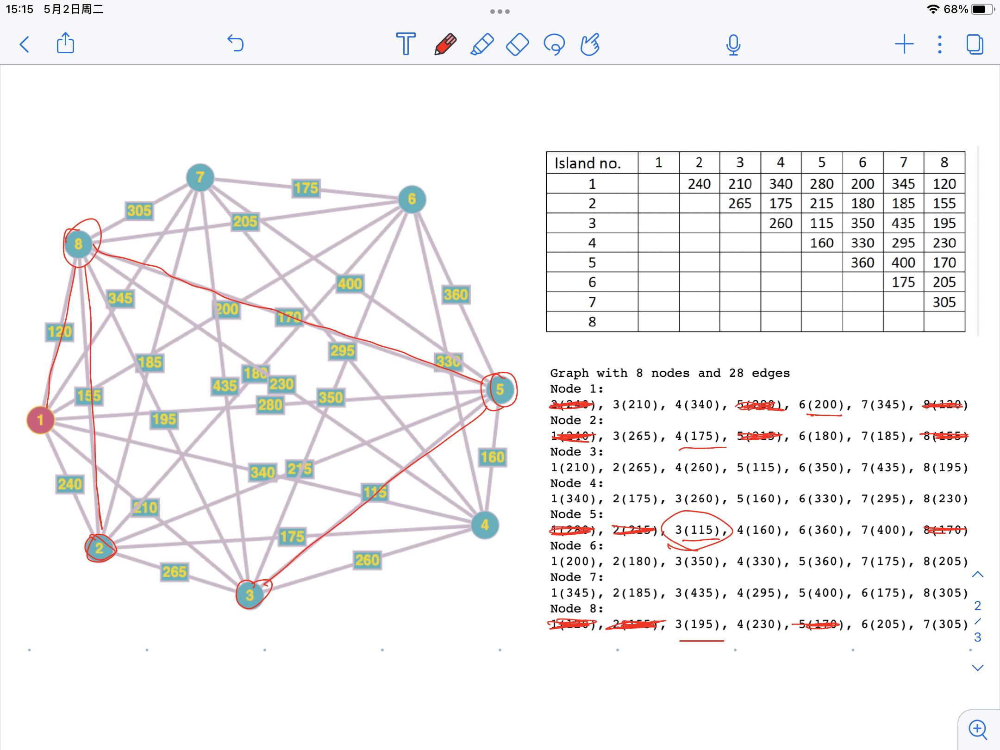

### step5 visited node:1,8,2,5,3,4

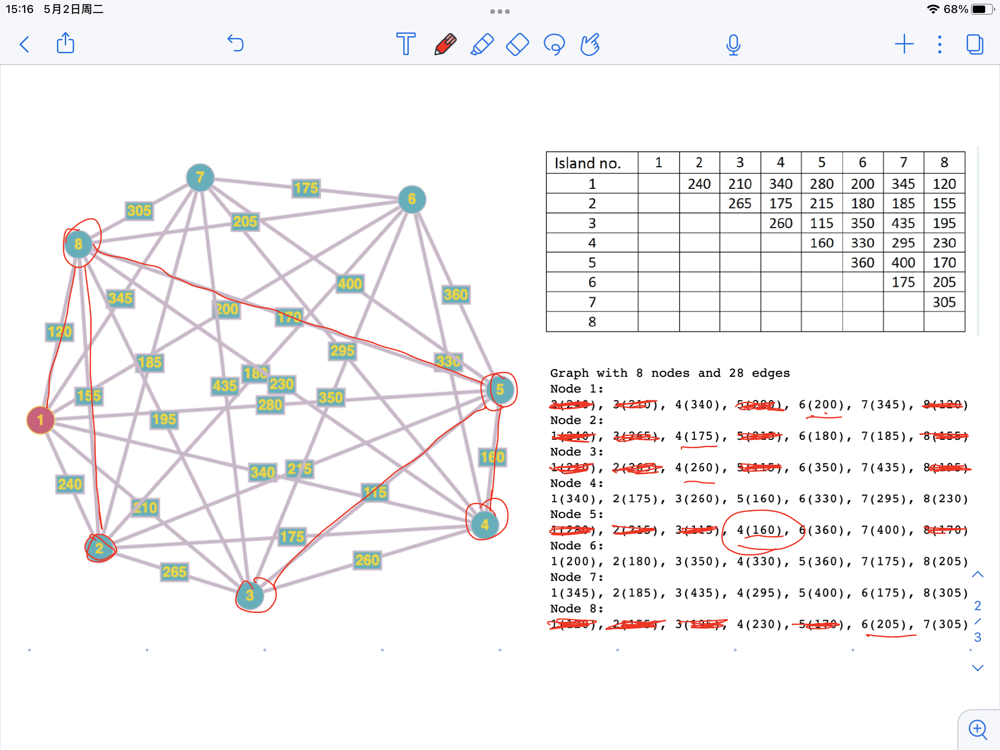

### step6 visited node:1,8,2,5,3,4,6

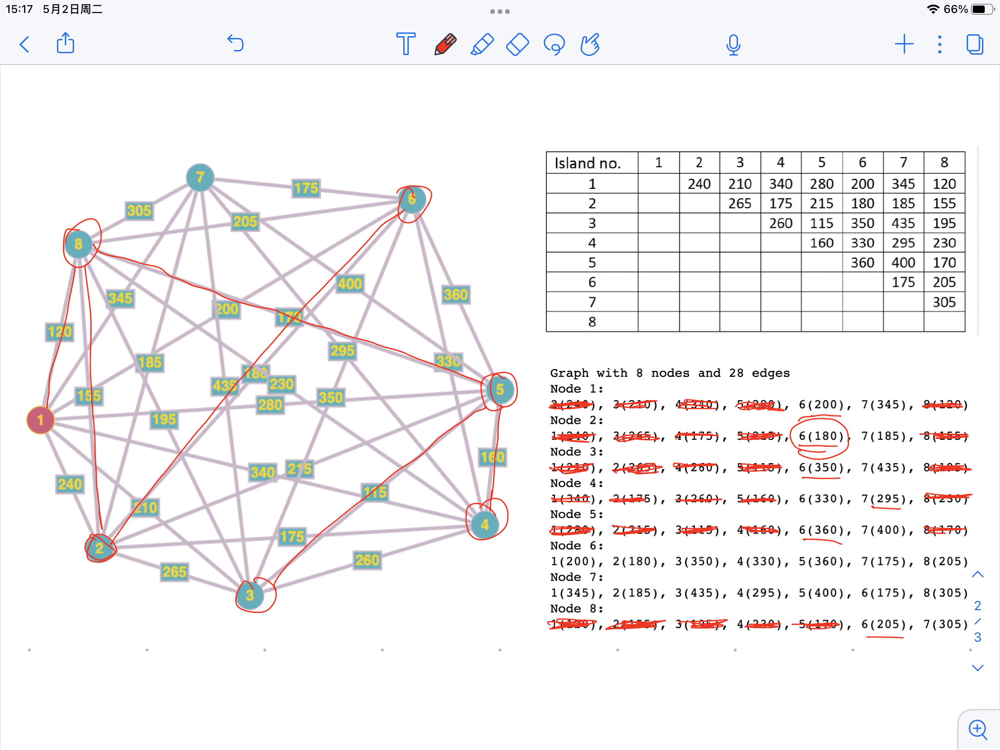

### step7 visited node:1,8,2,5,3,4,6,7

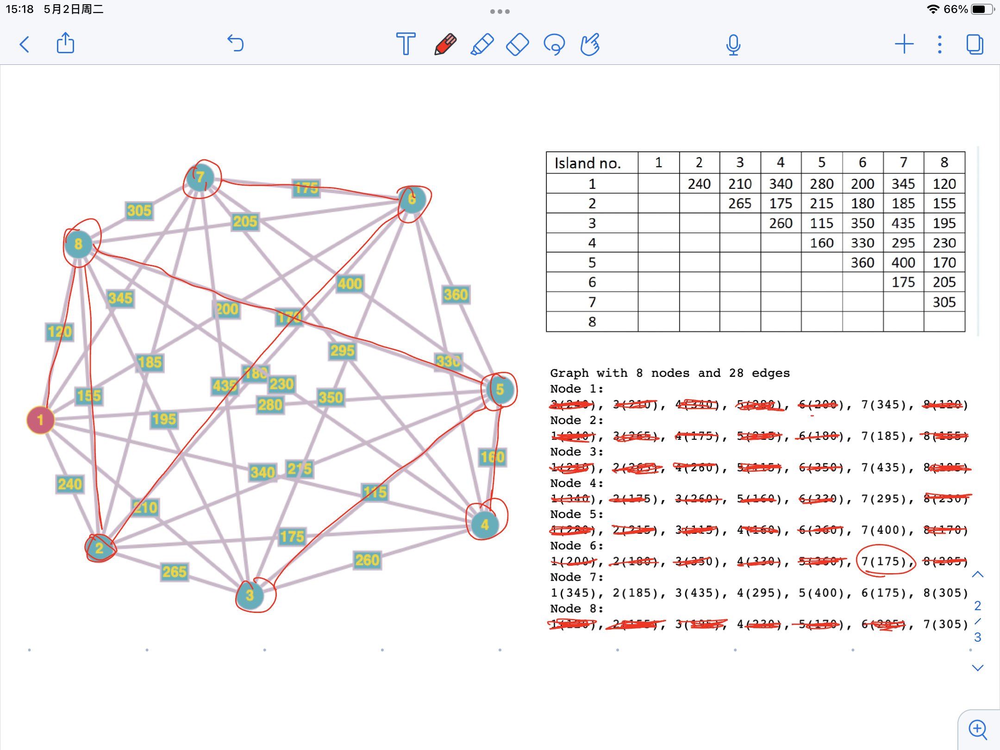

The final structure of the MST is as follows and the weight of the edges of the MST is 1075.

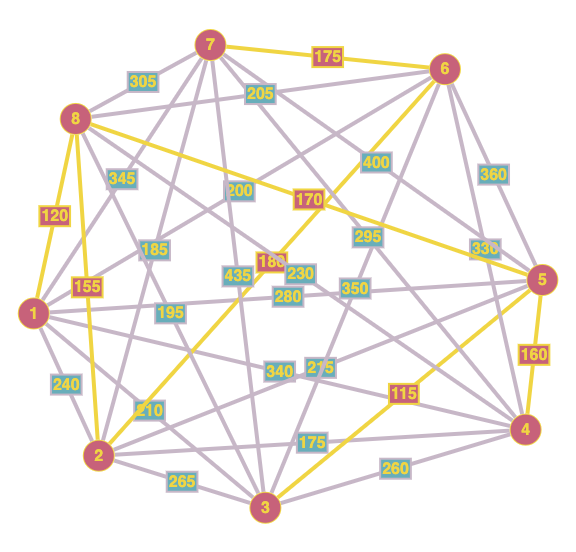

## 3.2Discuss the result

When constructing a minimum spanning tree, it is necessary to ensure that the graph is connected, meaning that any vertex can reach any other vertex. If the graph is not connected, a minimum spanning tree cannot be generated. 

In the above process, there are no edges with the same weight, so the final minimum spanning tree is unique. When there are edges with the same weight, multiple different versions of the minimum spanning tree may exist. This is because, during the execution of the algorithm, selecting different edges with the same weight will lead to different minimum spanning trees. However, the total weight of all these minimum spanning trees should be the same. 

Prim's algorithm and Kruskal's algorithm are classic algorithms for generating minimum spanning trees. They have different performance characteristics in different situations:

**Prim's algorithm:**
**Basic idea:** Starting from any vertex, gradually add vertices to the generated minimum spanning tree set, each time selecting the edge with the smallest weight connected to the vertices in the set. This is a locally optimal choice because, at the current stage, it minimizes the increase in the weight of the current minimum spanning tree. Prim's algorithm continuously repeats this process until all vertices are added to the minimum spanning tree set.
**Time complexity:** When using a priority queue, the time complexity is **O(E + VlogV)**, where E is the number of edges and V is the number of vertices.
Applicable scenarios: When there are many vertices in the graph and the edge density is high, Prim's algorithm is relatively more efficient.

**Kruskal's algorithm:**
**Basic idea:** At each stage, the algorithm selects the edge with the smallest weight that has not yet been added to the minimum spanning tree set and checks whether adding the edge would form a cycle. If it does not form a cycle, the edge is added to the minimum spanning tree set. This is also a locally optimal choice because, at the current stage, it minimizes the increase in the weight of the current minimum spanning tree. Kruskal's algorithm continuously repeats this process until the number of edges in the minimum spanning tree is equal to the number of vertices minus one.
**Time complexity:** Mainly depends on sorting, with a time complexity of **O(ElogE)**, where E is the number of edges.
Applicable scenarios: When the graph has fewer edges, i.e., a sparse graph, Kruskal's algorithm is relatively more efficient. The edge density of the above undirected weighted graph is relatively high, so Prim's algorithm is suitable. 


Both Prim's and Kruskal's algorithms are greedy algorithms because they adopt a greedy strategy when constructing a minimum spanning tree: A greedy algorithm is an optimization strategy that selects a locally optimal solution at each decision stage. This means that at each step, the algorithm chooses the solution that currently seems best, rather than considering the entire problem. Greedy algorithms generally cannot guarantee finding a globally optimal solution, but in some problems, they can indeed find a globally optimal solution.

## 3.3 Verify the result in 3.1 using NetworkX 

### 3.3.1 Using networkX Python package to create an empty weighted graph, G 

In [39]:
G = nx.Graph()

### 3.3.2 add vertices (nodes) with their weights given in table to G

In [60]:
G.add_edge("1", "2", weight=240)
G.add_edge("1", "3", weight=210)
G.add_edge("1", "4", weight=340)
G.add_edge("1", "5", weight=280)
G.add_edge("1", "6", weight=200)
G.add_edge("1", "7", weight=345)
G.add_edge("1", "8", weight=120)
G.add_edge("2", "3", weight=265)
G.add_edge("2", "4", weight=175)
G.add_edge("2", "5", weight=215)
G.add_edge("2", "6", weight=180)
G.add_edge("2", "7", weight=185)
G.add_edge("2", "8", weight=155)
G.add_edge("3", "4", weight=260)
G.add_edge("3", "5", weight=115)
G.add_edge("3", "6", weight=350)
G.add_edge("3", "7", weight=435)
G.add_edge("3", "8", weight=195)
G.add_edge("4", "5", weight=160)
G.add_edge("4", "6", weight=330)
G.add_edge("4", "7", weight=295)
G.add_edge("4", "8", weight=230)
G.add_edge("5", "6", weight=360)
G.add_edge("5", "7", weight=400)
G.add_edge("5", "8", weight=170)
G.add_edge("6", "7", weight=175)
G.add_edge("6", "8", weight=205)
G.add_edge("7", "8", weight=305)


print(G)
for node in G.nodes:
    print(f"Node {node}:")
    neighbor_weights = []
    for neighbor in G.neighbors(node):
        weight = G.edges[node, neighbor]["weight"]
        neighbor_weights.append(f"{neighbor}({weight})")
    print(", ".join(neighbor_weights))

        

Graph with 8 nodes and 28 edges
Node 1:
2(240), 3(210), 4(340), 5(280), 6(200), 7(345), 8(120)
Node 2:
1(240), 3(265), 4(175), 5(215), 6(180), 7(185), 8(155)
Node 3:
1(210), 2(265), 4(260), 5(115), 6(350), 7(435), 8(195)
Node 4:
1(340), 2(175), 3(260), 5(160), 6(330), 7(295), 8(230)
Node 5:
1(280), 2(215), 3(115), 4(160), 6(360), 7(400), 8(170)
Node 6:
1(200), 2(180), 3(350), 4(330), 5(360), 7(175), 8(205)
Node 7:
1(345), 2(185), 3(435), 4(295), 5(400), 6(175), 8(305)
Node 8:
1(120), 2(155), 3(195), 4(230), 5(170), 6(205), 7(305)


### 3.3.3 draw G for the position (pos) parameter

Using the MDS method to align the distances between each vertex and the length of the edges in the graph. Firstly, the Dijkstra algorithm is applied to compute the shortest distance between all pairs of vertices. Then, these distances are used as input to calculate the vertex positions in two dimensions using the MDS method from the scikit-learn library. Finally, these positions are used to draw the graph.

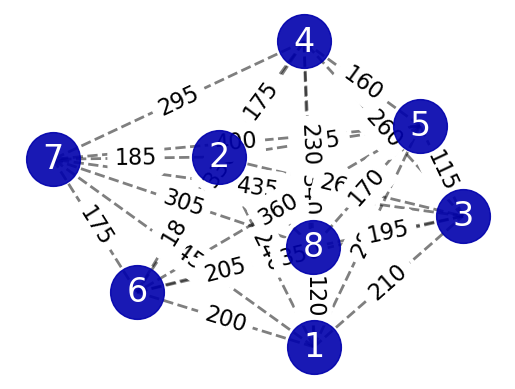

In [55]:
# Calculate all-pairs shortest paths
shortest_paths = nx.all_pairs_dijkstra_path_length(G)

# Create a distance matrix
distance_matrix = np.zeros((len(G.nodes), len(G.nodes)))
for source, paths in shortest_paths:
    for target, distance in paths.items():
        distance_matrix[int(source)-1, int(target)-1] = distance

# Perform MDS
embedding = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
pos = embedding.fit_transform(distance_matrix)

# Normalize the positions to [-1, 1]
pos = (pos - pos.min(axis=0)) / (pos.max(axis=0) - pos.min(axis=0)) * 2 - 1

# Convert the positions to a dictionary
pos_dict = {str(i + 1): pos[i] for i in range(len(G.nodes))}

# Draw the nodes, edges, and labels
nx.draw_networkx_nodes(G, pos_dict, node_size=1500, alpha=.9, node_color='#0000ac')
nx.draw_networkx_edges(G, pos_dict, width=2, alpha=0.5, edge_color='k', style='dashed')
nx.draw_networkx_labels(G, pos_dict, font_size=24, font_family='sans-serif', font_color='white')

# Add edge labels for weights
edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos_dict, edge_labels=edge_labels, font_size=16, font_family='sans-serif')

# Turn off axis
limits = plt.axis('off')

# Show the plot
plt.show()


### 3.3.4 compute the MST using NetworkX Package build-in Prims algorithm function and print a list that contains the minimum spanning tree.

In [50]:
 # Compute the minimum spanning tree using Prim's algorithm in NetworkX package 
mst = nx.minimum_spanning_tree(G)

# Print the edges of the minimum spanning tree
mst_edges = list(mst.edges(data=True))
print("Minimum Spanning Tree:", mst_edges)


Minimum Spanning Tree: [('1', '8', {'weight': 120}), ('2', '8', {'weight': 155}), ('2', '6', {'weight': 180}), ('3', '5', {'weight': 115}), ('4', '5', {'weight': 160}), ('5', '8', {'weight': 170}), ('6', '7', {'weight': 175})]


### 3.3.5 draw the MST graph

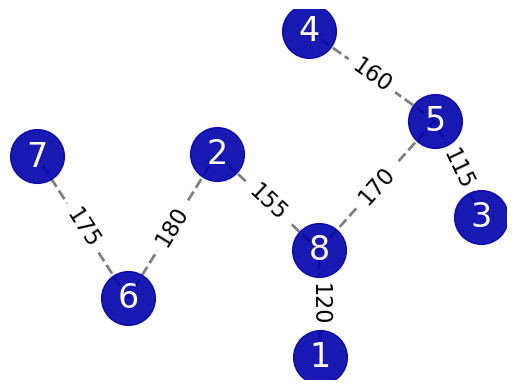

In [56]:
# Calculate all-pairs shortest paths
shortest_paths = nx.all_pairs_dijkstra_path_length(G)

# Create a distance matrix
distance_matrix = np.zeros((len(G.nodes), len(G.nodes)))
for source, paths in shortest_paths:
    for target, distance in paths.items():
        distance_matrix[int(source)-1, int(target)-1] = distance

# Perform MDS
embedding = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
pos = embedding.fit_transform(distance_matrix)

# Normalize the positions to [-1, 1]
pos = (pos - pos.min(axis=0)) / (pos.max(axis=0) - pos.min(axis=0)) * 2 - 1

# Convert the positions to a dictionary
pos_dict = {str(i + 1): pos[i] for i in range(len(G.nodes))}

# Compute the minimum spanning tree
mst = nx.minimum_spanning_tree(G)

# Draw the nodes, edges, and labels of the original graph
nx.draw_networkx_nodes(G, pos_dict, node_size=1500, alpha=.9, node_color='#0000ac')
nx.draw_networkx_labels(G, pos_dict, font_size=24, font_family='sans-serif', font_color='white')

# Draw the edges that are part of the minimum spanning tree
for u, v, data in mst.edges(data=True):
    nx.draw_networkx_edges(G, pos_dict, edgelist=[(u, v)], width=2, alpha=0.5, edge_color='k', style='dashed')
    nx.draw_networkx_edge_labels(G, pos_dict, edge_labels={(u, v): data['weight']}, font_size=16, font_family='sans-serif')

# Turn off axis
limits = plt.axis('off')

# Show the plot
plt.show()


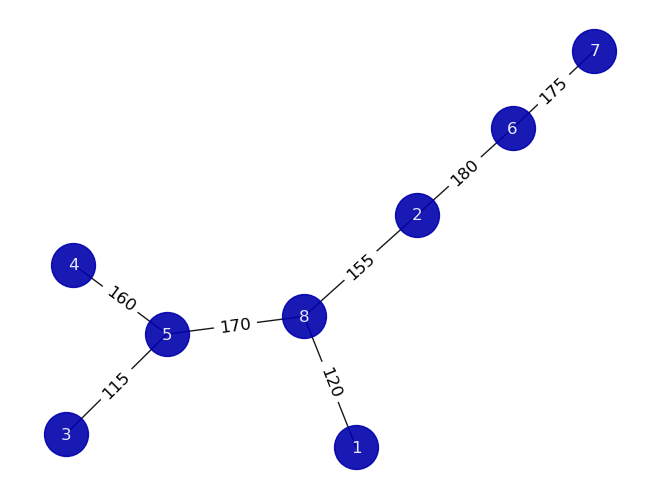

In [51]:
# Compute the minimum spanning tree using Prim's algorithm
mst = nx.minimum_spanning_tree(G)

# Draw the minimum spanning tree
pos = nx.spring_layout(mst, seed=42)
nx.draw(mst, pos, with_labels=True, node_color='#0000ac', font_color='white', font_size=12, node_size=1000, alpha=.9)
nx.draw_networkx_edge_labels(mst, pos, edge_labels={(u, v): d["weight"] for u, v, d in mst.edges(data=True)}, font_size=12)

# Turn off axis
plt.axis('off')

# Show the plot
plt.show()


# Conclusion

1. The implementation of sorting algorithms confirm time complexity of Bubble sort (quadratic), Quick sort in worst case (quadratic) and Merge sort (nlogn)
2. Hand drawing implementation of Dijkstra and networkx Dijkstra calculation show the same result